# PCB Defect Detection Project
-----

#### This project aims to determine missing components using a single PCB card reference and checking the test card. To achieve this, the project utilizes the OpenCV library in Python and employs different image comparison algorithms. Each comparison Throughout this process, we aim to find the most efficient and reliable comparison method.
----

## 1. Method: Histogram Comparison
---
Histogram comparison is a more primitive way of comparing two images. In this method, you compare to color of the images. For example, if you compare a red tomato and a green apple. The similarity ratio will be low and close to %0. It means they aren't similar. But if you compare a red tomato with a red apple. The similarity ratio will be high and close to %100. It means similar. In fact, we know that tomatoes and red apples aren't similar. The Histogram method compares two images using color density. It is a basic, rapid method.

https://docs.opencv.org/3.4/d8/dbc/tutorial_histogram_calculation.html 


https://medium.com/@sasasulakshi/opencv-image-histogram-calculations-4c5e736f85e


Similarity Ratio: 99.12%


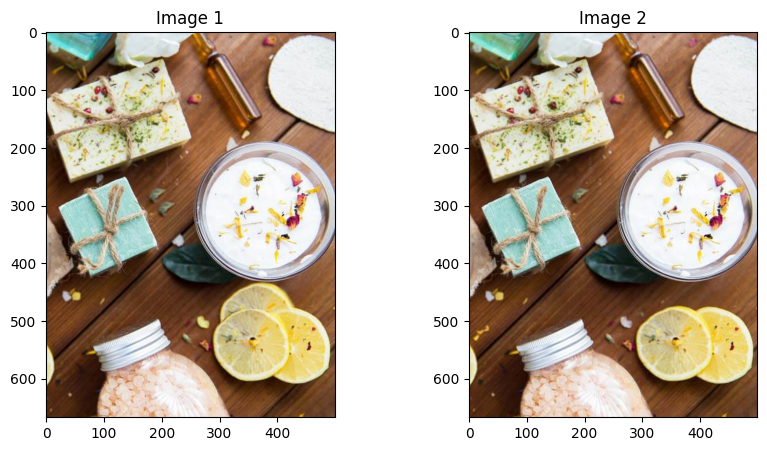

Similarity Ratio: 98.85%


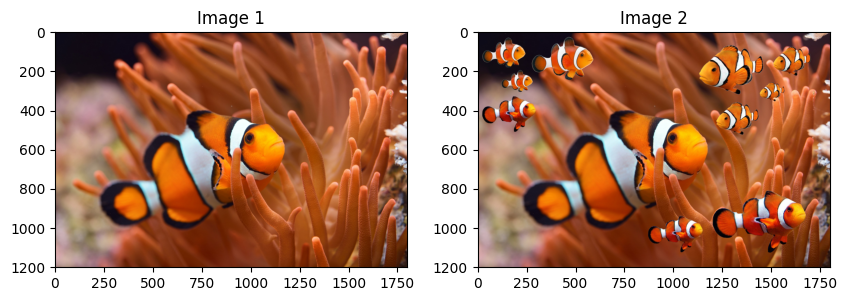

Similarity Ratio: 89.62%


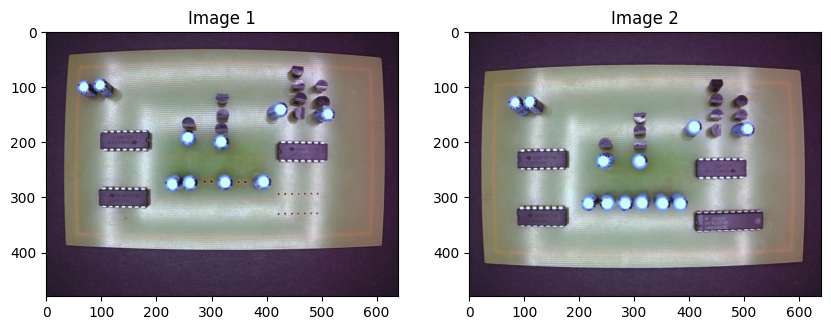

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def compare_images(image1, image2,):
    
    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    hist1 = cv2.calcHist([gray1], [0], None, [256], [0, 256])
    hist2 = cv2.calcHist([gray2], [0], None, [256], [0, 256])
    
    similarity = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
    print(f"Similarity Ratio: {similarity * 100:.2f}%")
    
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 2, 1)
    plt.title('Image 1')
    plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
    
    plt.subplot(1, 2, 2)
    plt.title('Image 2')
    plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))

    plt.show()


image1 = cv2.imread('image1.jpg')
image2 = cv2.imread('image2.jpg')
image3 = cv2.imread("fish1.jpg")
image4 = cv2.imread("fish2.jpg")
image5 = cv2.imread("j.jpeg")
image6 = cv2.imread("g.jpeg")

compare_images(image1, image2)
compare_images(image3, image4)
compare_images(image5, image6)

Benzerlik yüzdesi: 99.12%


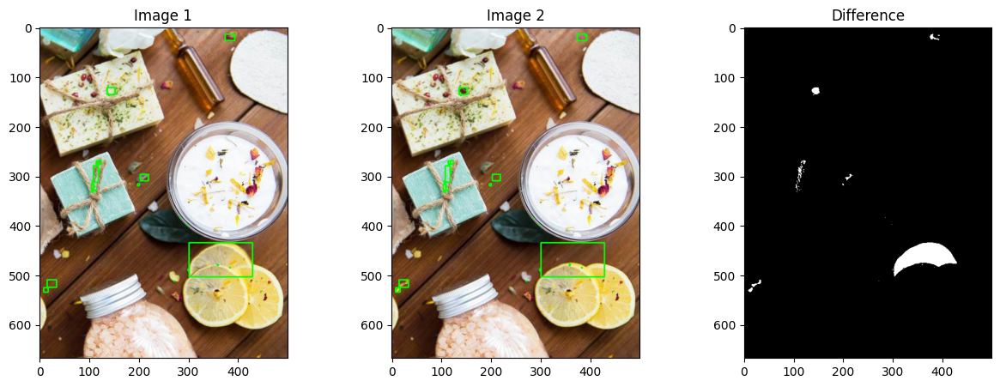

Benzerlik yüzdesi: 98.85%


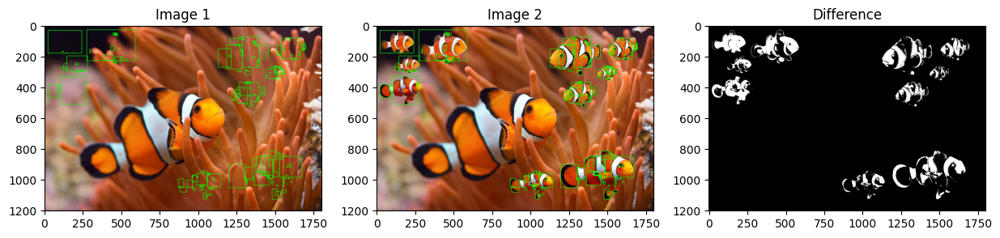

Benzerlik yüzdesi: 96.31%


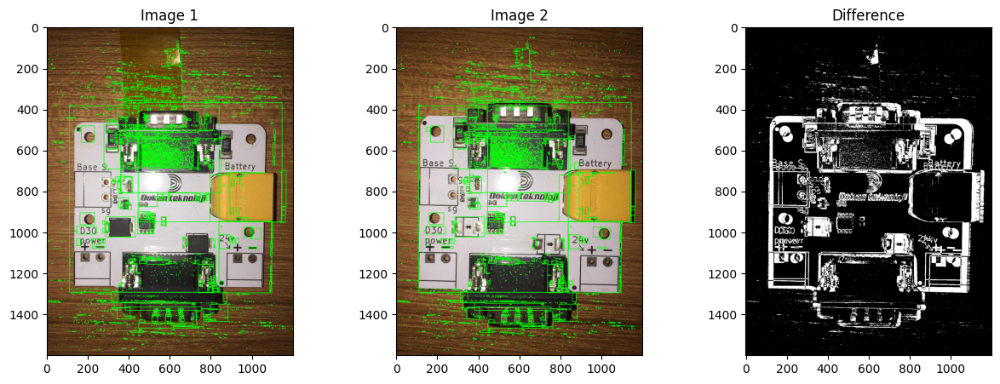

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def compare_images(image1, image2):

    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
    

    hist1 = cv2.calcHist([gray1], [0], None, [256], [0, 256])
    hist2 = cv2.calcHist([gray2], [0], None, [256], [0, 256])

    similarity = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
    print(f"Benzerlik yüzdesi: {similarity * 100:.2f}%")

    difference = cv2.absdiff(gray1, gray2)

    _, thresh = cv2.threshold(difference, 50, 255, cv2.THRESH_BINARY)

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for contour in contours:
        (x, y, w, h) = cv2.boundingRect(contour)
        cv2.rectangle(image1, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.rectangle(image2, (x, y), (x + w, y + h), (0, 255, 0), 2)
    
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.title('Image 1')
    plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
    
    plt.subplot(1, 3, 2)
    plt.title('Image 2')
    plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
    
    plt.subplot(1, 3, 3)
    plt.title('Difference')
    plt.imshow(thresh, cmap='gray')
    
    plt.show()


image1 = cv2.imread('image1.jpg')
image2 = cv2.imread('image2.jpg')
image3 = cv2.imread("fish1.jpg")
image4 = cv2.imread("fish2.jpg")
image5 = cv2.imread("5.jpg")
image6 = cv2.imread("6.jpg")

compare_images(image1, image2)
compare_images(image3, image4)
compare_images(image5, image6)


## 2. Method: Template Matching
----
Template matching is comparison method when finding a pattern or an object. This method is need to a reference image and template image from the reference image. There are 6 different method in the template mathcing. The downsides of the this method are in the big images because of the calculation it needs more calculation power and can be give some wrong results. 

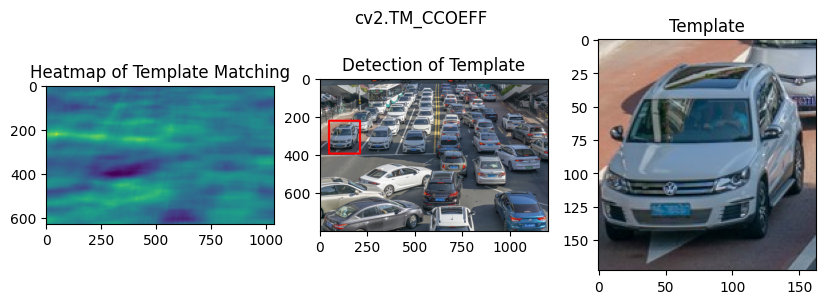

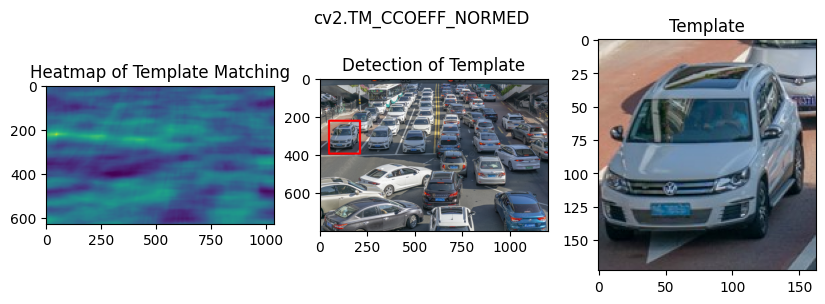

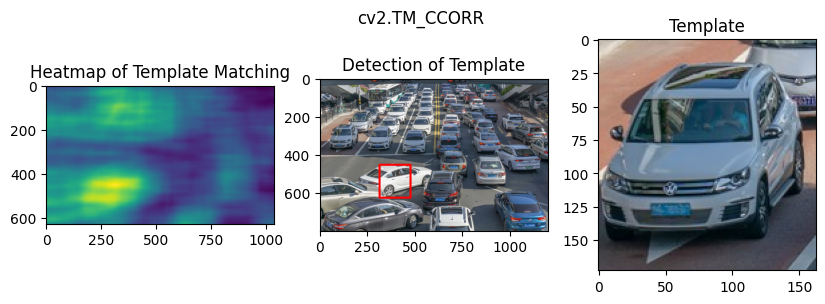

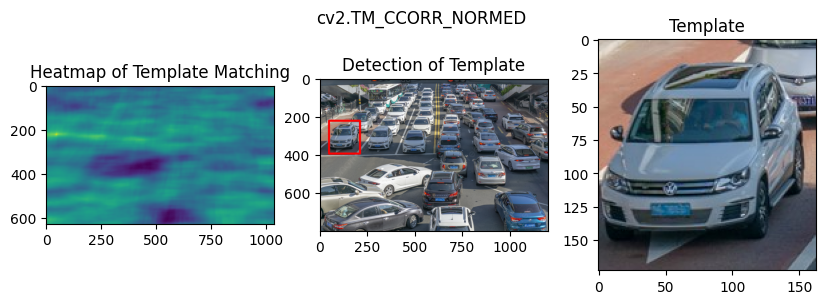

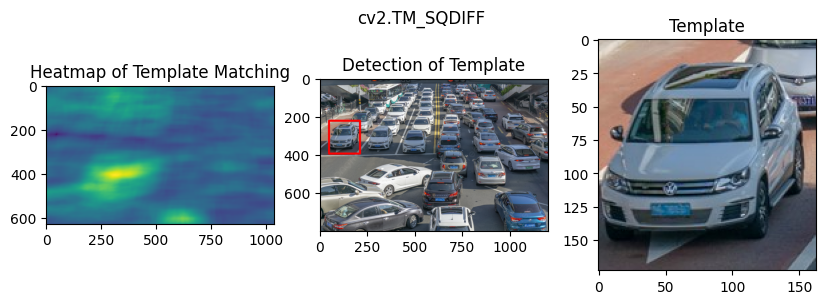

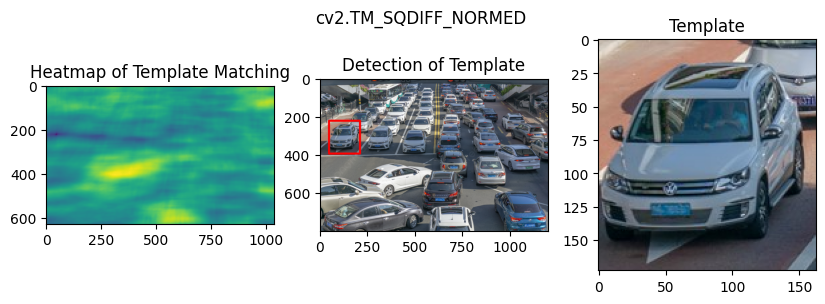

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

image1 = cv2.imread("try2.jpg")
template_img = cv2.imread("try1.jpg")


image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
template_img = cv2.cvtColor(template_img, cv2.COLOR_BGR2RGB)


image2_copy = template_img.copy()


methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR', 'cv2.TM_CCORR_NORMED',
           'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']


for m in methods:
    image1_copy = image1.copy()
    method = eval(m)  


    result = cv2.matchTemplate(image1_copy, template_img, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

 
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc

   
    height, width, channels = template_img.shape
    bottom_right = (top_left[0] + width, top_left[1] + height)

   
    cv2.rectangle(image1_copy, top_left, bottom_right, (255, 0, 0), 10)


    fig = plt.figure(figsize=(10, 3))
    
    ax1 = fig.add_subplot(131)
    ax1.imshow(result, )
    ax1.set_title("Heatmap of Template Matching")

    ax2 = fig.add_subplot(132)
    ax2.imshow(image1_copy)
    ax2.set_title("Detection of Template")

    ax3 = fig.add_subplot(133)
    ax3.imshow(image2_copy)
    ax3.set_title("Template")
    
    fig.suptitle(m)
    plt.show()
    
    print("\n")
    print("\n")


## 3. Method Feature Matching
---
Feature matching is another way for matching images. This methods find keypoint and define descriptor for this point and compare other image for finding corresponding point. This method can find different scale, size, or skewed image. There are more than three way for feature matching. I only show three of them.

https://stackoverflow.com/questions/11541154/checking-images-for-similarity-with-opencv

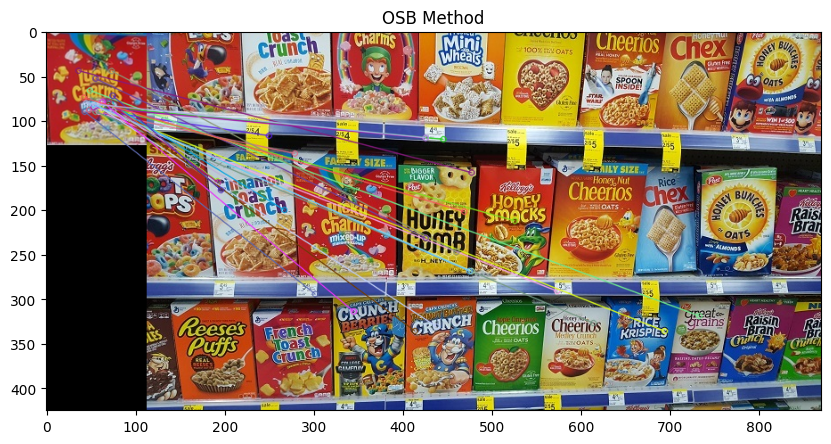

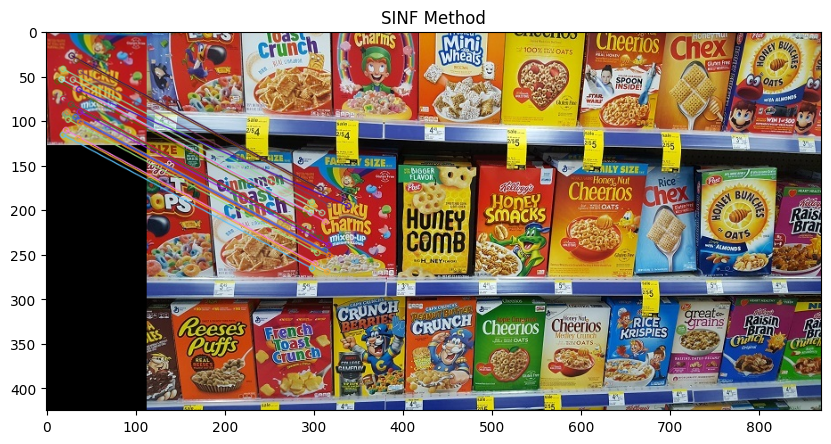

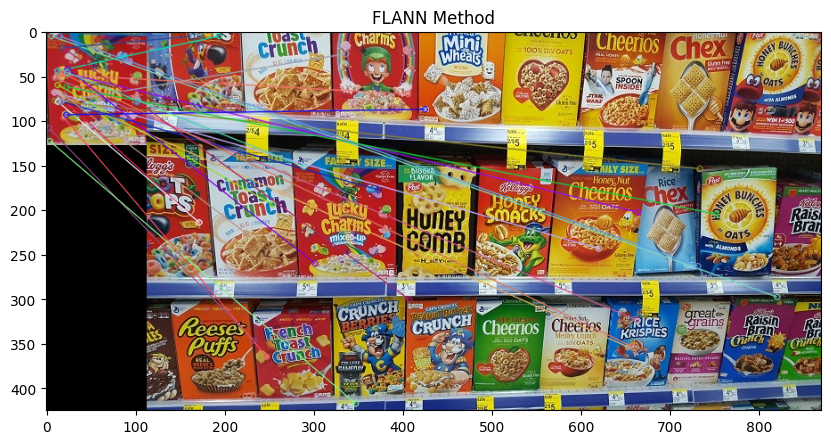

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

""""
References
skp = sift keypoint
sdes = sift descriptor

sbf = sift brute force

"""



def display(img, title):
    
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(title)
    plt.show()



img1 = cv2.imread('7.jpg',cv2.COLOR_BGR2GRAY)
img2 = cv2.imread("8.jpg",cv2.COLOR_BGR2GRAY)

# Method 1
#-------------------------------------------------------------------------------
orb = cv2.ORB_create()
kp1,des1 = orb.detectAndCompute(img1,None)
kp2,des2 = orb.detectAndCompute(img2,None)
bf = cv2.BFMatcher(cv2.NORM_HAMMING,crossCheck=True)
matches = bf.match(des1,des2)
matches = sorted(matches,key= lambda x:x.distance )
matches = cv2.drawMatches(img1,kp1,img2,kp2,matches[:25],None,flags =2)

# Method 2
#-------------------------------------------------------------------------------
sift = cv2.SIFT_create()
skp1,sdes1 = sift.detectAndCompute(img1,None)
skp2,sdes2 = sift.detectAndCompute(img2,None)
sbf = cv2.BFMatcher()
sift_matches = sbf.knnMatch(sdes1,sdes2,k=2)

# less distance == better match
#ratio test
good_sift_matches = []
for match1,match2 in sift_matches:
   if match1.distance<0.75*match2.distance:
      good_sift_matches.append([match1])   
sift_matches = cv2.drawMatchesKnn(img1,skp1,img2,skp2,good_sift_matches[:25],None,flags=2)

# Method 3
#-------------------------------------------------------------------------------

sift = cv2.SIFT_create()
fkp1,fdes1 = sift.detectAndCompute(img1,None)
fkp2,fdes2 = sift.detectAndCompute(img2,None)
FLANN_INDEX_KDTREE=0
index_params = dict(algorithm=FLANN_INDEX_KDTREE,trees=5)
search_params = dict(checks=50) 
flann = cv2.FlannBasedMatcher(indexParams=index_params,searchParams=search_params)
flann_matches= flann.knnMatch(fdes1,fdes2,k=2)



good_flann_matches = []
for fmatch1,fmatch2 in flann_matches:
   if fmatch1.distance>0.7*fmatch2.distance:
      good_flann_matches.append([fmatch2])

flann_matches=cv2.drawMatchesKnn(img1,fkp1,img2,fkp2,good_flann_matches[:25],None,flags=2)

display(matches,"OSB Method")
display(sift_matches,"SINF Method")
display(flann_matches,"FLANN Method")



In [5]:
import cv2
import numpy as np

# Load images
img1 = cv2.imread('image1.jpg', cv2.COLOR_BGR2GRAY)
img2 = cv2.imread('image2.jpg', cv2.COLOR_BGR2GRAY)

# Check if images are loaded properly
if img1 is None or img2 is None:
    raise ValueError("One or both images could not be loaded. Please check the file paths.")

# Initiate SIFT detector
sift = cv2.SIFT_create()

# Find keypoints and descriptors with SIFT
skp1, sdes1 = sift.detectAndCompute(img1, None)
skp2, sdes2 = sift.detectAndCompute(img2, None)

# Create BFMatcher object
sbf = cv2.BFMatcher()

# Perform knn matching
sift_matches = sbf.knnMatch(sdes1, sdes2, k=2)

# Apply ratio test
good_sift_matches = []
for m, n in sift_matches:
    if m.distance < 0.75 * n.distance:
        good_sift_matches.append(m)

# Draw matches
sift_img_matches = cv2.drawMatches(img1, skp1, img2, skp2, good_sift_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display result
cv2.imshow('SIFT Matches', sift_img_matches)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Initiate ORB detector
orb = cv2.ORB_create()

# Find keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Create BFMatcher object for ORB
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Perform matching with ORB
matches = bf.match(des1, des2)

# Sort matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Draw matches
orb_img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:25], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display result
cv2.imshow('ORB Matches', orb_img_matches)
cv2.waitKey(0)
cv2.destroyAllWindows()


## 4. Method Structural Similarity Index Measure
----

SSIM is the method for finding similarity between two images. This method is different from simple pixel by pixel methods. It consider luminance, contrast and structure when comparison. This  makes more accurate assessment of image comparison. The downsides of this method is more powerful tool for same scale images. And for the complex image it not perform good results.
SSIM return a value around -1 and 1. 1 indicates images are so similar, and -1 incidates images are very different.

https://medium.com/srm-mic/all-about-structural-similarity-index-ssim-theory-code-in-pytorch-6551b455541e

Similarity Score: 89.462%


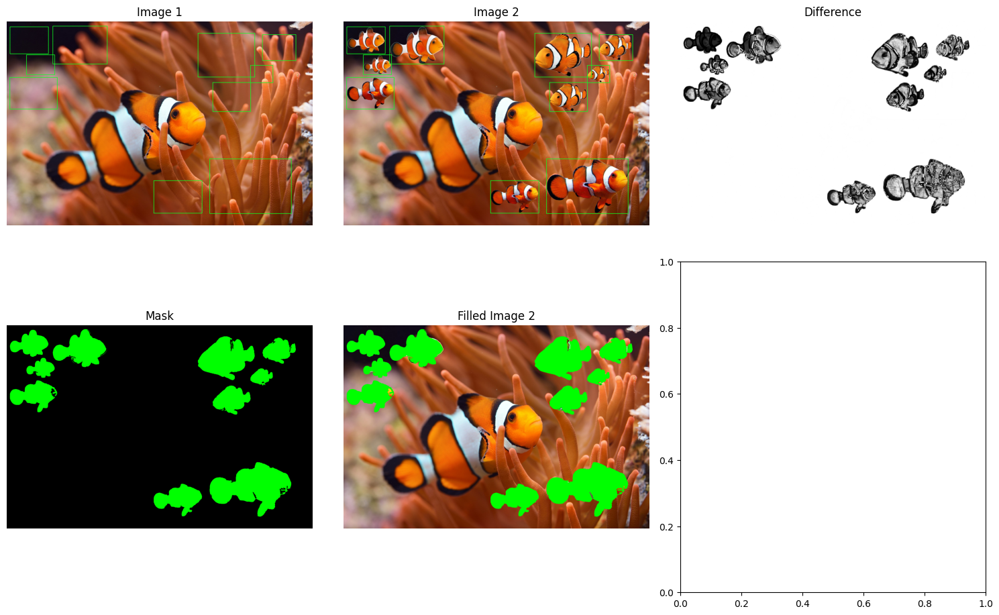

Similarity Score: 91.989%


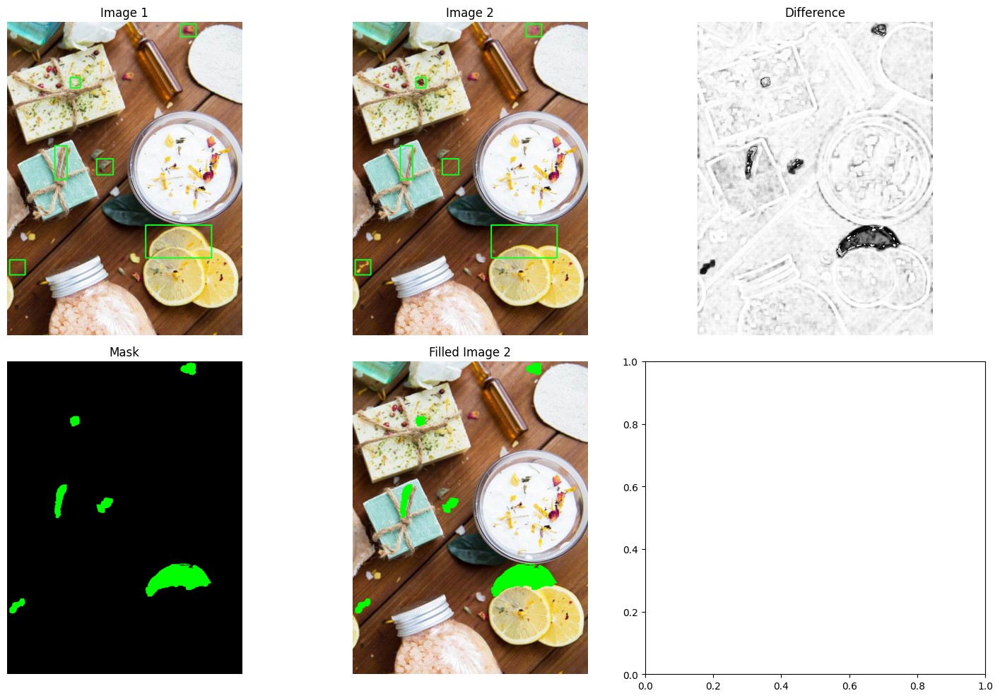

Similarity Score: 52.452%


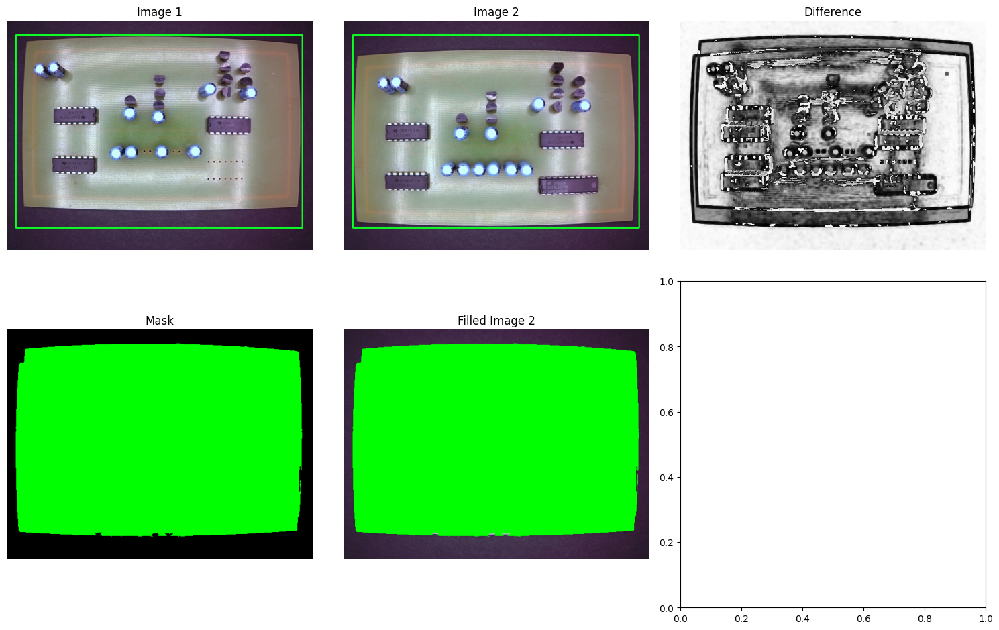

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
from skimage.metrics import structural_similarity



def showdifference(img1,img2):
    # Convert to grayscale
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # Calculate Structural Similarity Index (SSIM)
    score, diff = structural_similarity(gray1, gray2, full=True)
    print("Similarity Score: {:.3f}%".format(score * 100))

    # Convert difference image to uint8
    diff = (diff * 255).astype("uint8")

    # Threshold the difference image
    thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]

    # Find contours
    contours = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = contours[0] if len(contours) == 2 else contours[1]

    # Create masks
    mask = np.zeros(img1.shape, dtype='uint8')
    filled = img2.copy()

    # Draw rectangles and contours
    for c in contours:
        area = cv2.contourArea(c)
        if area > 100:
            x, y, w, h = cv2.boundingRect(c)
            cv2.rectangle(img1, (x, y), (x + w, y + h), (36, 255, 12), 2)
            cv2.rectangle(img2, (x, y), (x + w, y + h), (36, 255, 12), 2)
            cv2.drawContours(mask, [c], 0, (0, 255, 0), -1)
            cv2.drawContours(filled, [c], 0, (0, 255, 0), -1)

    # Display images using matplotlib
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))

    # Original images
    axs[0, 0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    axs[0, 0].set_title('Image 1')
    axs[0, 0].axis('off')

    axs[0, 1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    axs[0, 1].set_title('Image 2')
    axs[0, 1].axis('off')

        # Difference image
    axs[0, 2].imshow(diff, cmap='gray')
    axs[0, 2].set_title('Difference')
    axs[0, 2].axis('off')

        # Mask
    axs[1, 0].imshow(mask)
    axs[1, 0].set_title('Mask')
    axs[1, 0].axis('off')

        # Filled image
    axs[1, 1].imshow(cv2.cvtColor(filled, cv2.COLOR_BGR2RGB))
    axs[1, 1].set_title('Filled Image 2')
    axs[1, 1].axis('off')

        # Show plot
    plt.tight_layout()
    plt.show()


image1 = cv2.imread("fish1.jpg")
image2 = cv2.imread("fish2.jpg")
image3 = cv2.imread("image1.jpg")
image4 = cv2.imread("image2.jpg")
image5 = cv2.imread("j.jpeg")
image6 = cv2.imread("g.jpeg")


showdifference(image1,image2)
showdifference(image3,image4)
showdifference(image5,image6)



## 5. Method Absolute Diffrence
---
Absolute Difference method is a pixel wise comparison method. Absolute difference thinking image as a matrix and taking difference between two matrix.

https://mesutpiskin.com/blog/opencv-arka-plan-temizleme-absdiff.html

https://stackoverflow.com/questions/65150972/difference-between-absdiff-and-normal-subtraction-in-opencv



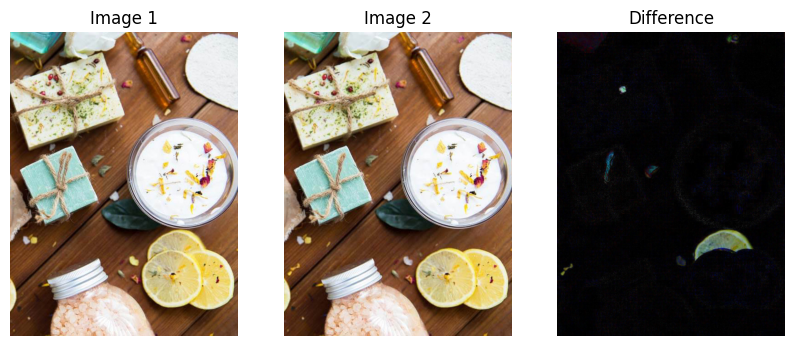

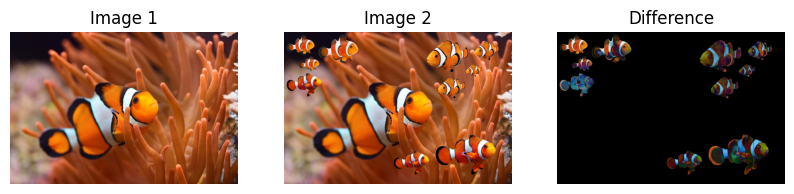

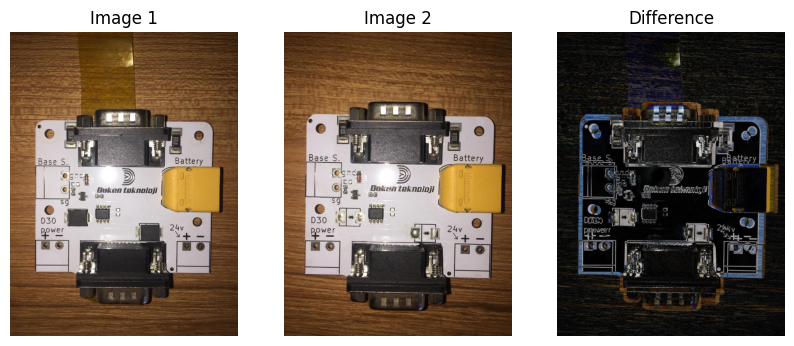

In [7]:
import cv2
import matplotlib.pyplot as plt


def AbsoluteDiff(imagea,imageb):

    difference = cv2.absdiff(imagea, imageb)



    
    image1_rgb = cv2.cvtColor(imagea, cv2.COLOR_BGR2RGB)
    image2_rgb = cv2.cvtColor(imageb, cv2.COLOR_BGR2RGB)
    difference_rgb = cv2.cvtColor(difference, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image1_rgb)
    plt.title('Image 1')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(image2_rgb)
    plt.title('Image 2')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(difference_rgb)
    plt.title('Difference')
    plt.axis('off')

    plt.show()


image1 = cv2.imread('image1.jpg')
image2 = cv2.imread('image2.jpg')
image3 = cv2.imread('fish1.jpg')
image4 = cv2.imread('fish2.jpg')
image5 = cv2.imread('5.jpg')
image6 = cv2.imread('6.jpg')

AbsoluteDiff(image1,image2)
AbsoluteDiff(image3,image4)
AbsoluteDiff(image5,image6)


## 6. Method Substract

----

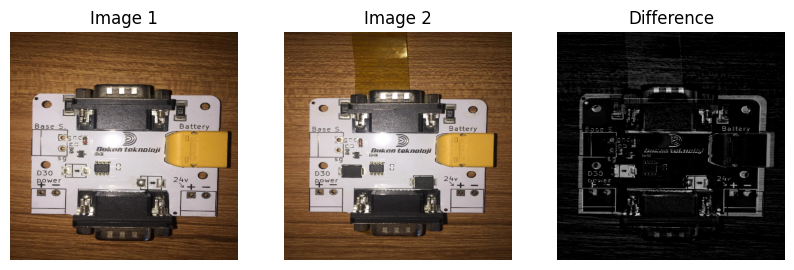

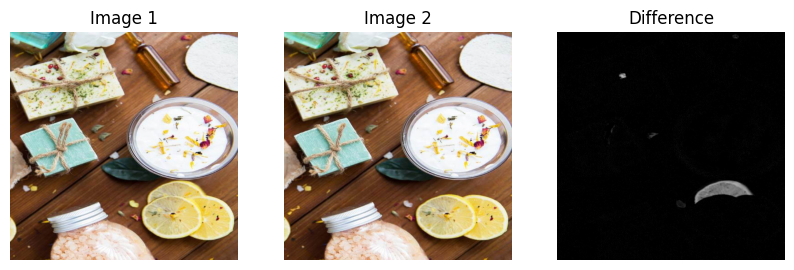

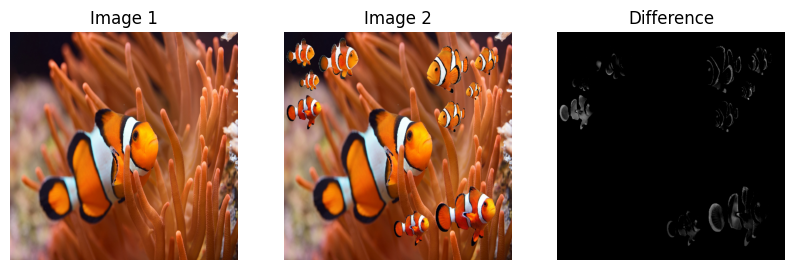

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import cv2



img1 = cv2.imread("image1.jpg")
img2 = cv2.imread("image2.jpg")
img3 = cv2.imread("5.jpg")
img4 = cv2.imread("6.jpg")
img5 = cv2.imread("fish1.jpg")
img6 = cv2.imread("fish2.jpg")


def SubtractMethod(imageA, imageB):
    
    imageA_resized = cv2.resize(imageA, (500, 500))
    imageB_resized = cv2.resize(imageB, (500, 500))

  
    grayA = cv2.cvtColor(imageA_resized, cv2.COLOR_BGR2GRAY)
    grayB = cv2.cvtColor(imageB_resized, cv2.COLOR_BGR2GRAY)


    subtracted_gray = cv2.subtract(grayA, grayB)

   
    subtracted_bgr = cv2.cvtColor(subtracted_gray, cv2.COLOR_GRAY2BGR)


    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(imageA_resized, cv2.COLOR_BGR2RGB))
    plt.title('Image 1')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(imageB_resized, cv2.COLOR_BGR2RGB))
    plt.title('Image 2')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(subtracted_bgr, cv2.COLOR_BGR2RGB))
    plt.title('Difference')
    plt.axis('off')

    plt.show()



SubtractMethod(img4,img3)
SubtractMethod(img1,img2)
SubtractMethod(img5,img6)


In [9]:
import cv2
import numpy as np


def resize_image(image, max_width, max_height):
    height, width = image.shape[:2]
    scaling_factor = min(max_width / width, max_height / height)
    new_size = (int(width * scaling_factor), int(height * scaling_factor))
    return cv2.resize(image, new_size)

imageA = cv2.imread('5.jpg', 0)
imageB = cv2.imread('6.jpg', 0)

h, w = imageA.shape	
warp_matrix = np.eye(2, 3, dtype=np.float32)


criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 5000, 1e-10)
(cc, warp_matrix) = cv2.findTransformECC(imageA, imageB, warp_matrix, cv2.MOTION_TRANSLATION, criteria)


aligned_imageB = cv2.warpAffine(imageB, warp_matrix, (w, h), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP)

max_width = 800  
max_height = 600  
imageA_resized = resize_image(imageA, max_width, max_height)
aligned_imageB_resized = resize_image(aligned_imageB, max_width, max_height)


difference = cv2.absdiff(imageA_resized, aligned_imageB_resized)
_, thresh = cv2.threshold(difference, 50, 255, cv2.THRESH_BINARY)


cv2.imshow("Original Image A", imageA_resized)
cv2.imshow("Aligned Image B", aligned_imageB_resized)
cv2.imshow("Difference", difference)

cv2.waitKey(0)
cv2.destroyAllWindows()


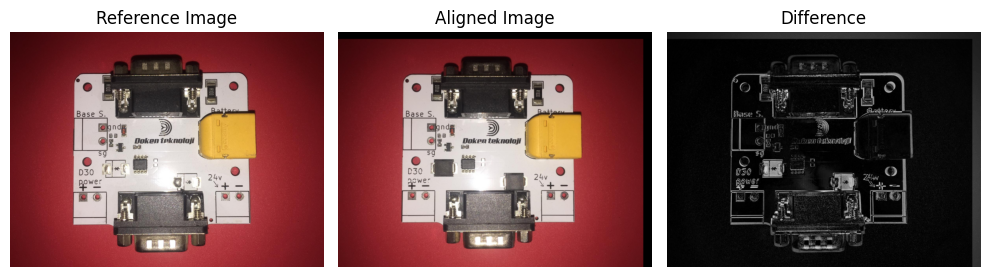

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to resize the images while keeping the aspect ratio
def resize_image(image, max_width, max_height):
    height, width = image.shape[:2]
    scaling_factor = min(max_width / width, max_height / height)
    new_size = (int(width * scaling_factor), int(height * scaling_factor))
    return cv2.resize(image, new_size)

# Load images
imageA = cv2.imread('9.jpg')
imageB = cv2.imread('10.jpg')

# Resize images if necessary
max_width = 800  # Adjust as needed
max_height = 600  # Adjust as needed
imageA_resized = resize_image(imageA, max_width, max_height)
imageB_resized = resize_image(imageB, max_width, max_height)

# Check dimensions
h, w = imageA_resized.shape[:2]

# ECC algorithm for alignment
warp_matrix = np.eye(2, 3, dtype=np.float32)
criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 5000, 1e-10)
(cc, warp_matrix) = cv2.findTransformECC(cv2.cvtColor(imageA_resized, cv2.COLOR_BGR2GRAY),
                                         cv2.cvtColor(imageB_resized, cv2.COLOR_BGR2GRAY),
                                         warp_matrix, cv2.MOTION_TRANSLATION, criteria)

# Align the second image
aligned_imageB_resized = cv2.warpAffine(imageB_resized, warp_matrix, (w, h), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP)

# Display images
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.title('Reference Image')
plt.imshow(cv2.cvtColor(imageA_resized, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Aligned Image')
plt.imshow(cv2.cvtColor(aligned_imageB_resized, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Difference')
difference = cv2.absdiff(cv2.cvtColor(imageA_resized, cv2.COLOR_BGR2GRAY),
                         cv2.cvtColor(aligned_imageB_resized, cv2.COLOR_BGR2GRAY))
plt.imshow(difference, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


# Main

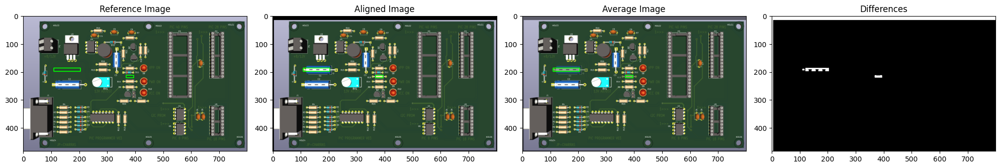

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import distance


def resize_image(image, max_width, max_height):
    height, width = image.shape[:2]
    scaling_factor = min(max_width / width, max_height / height)
    new_size = (int(width * scaling_factor), int(height * scaling_factor))
    return cv2.resize(image, new_size)

# Function to merge close contours


# Way1
#-------------------------------------------------------------------------------------------

def merge_close_contours(contours, min_distance=0, max_distance=50):
    if len(contours) == 0:
        return []

    merged_contours = []
    centers = [cv2.moments(cnt) for cnt in contours]
    centers = [(int(M['m10'] / M['m00']), int(M['m01'] / M['m00'])) if M['m00'] != 0 else (0, 0) for M in centers]

    merged = [False] * len(contours)

    for i in range(len(contours)):
        if not merged[i]:
            current_merge = [contours[i]]
            for j in range(i + 1, len(contours)):
                if not merged[j]:
                    
                    distance = np.sqrt((centers[i][0] - centers[j][0])**2 + (centers[i][1] - centers[j][1])**2)
                    if min_distance <= distance <= max_distance:
                        current_merge.append(contours[j])
                        merged[j] = True
            merged_contours.append(np.concatenate(current_merge))
            merged[i] = True

    return merged_contours

"""
# Way2
#-------------------------------------------------------------------------------------------

def merge_close_contours(contours, min_distance=20, max_distance=70):
    if len(contours) == 0:
        return []

    merged_contours = []
    centers = [cv2.moments(cnt) for cnt in contours]
    centers = [(int(M['m10'] / M['m00']), int(M['m01'] / M['m00'])) if M['m00'] != 0 else (0, 0) for M in centers]
    distances = distance.cdist(centers, centers, 'euclidean')
    
    merged = [False] * len(contours)
    
    for i in range(len(contours)):
        if not merged[i]:
            current_merge = [contours[i]]
            for j in range(i + 1, len(contours)):
                if not merged[j] and min_distance <= distances[i, j] <= max_distance:
                    current_merge.append(contours[j])
                    merged[j] = True
            merged_contours.append(np.concatenate(current_merge))
            merged[i] = True
            
    return merged_contours
"""


# Function to merge overlapping bounding rectangles
def merge_overlapping_rectangles(rectangles):
    if len(rectangles) == 0:
        return []

    rectangles = [list(rect) for rect in rectangles]
    merged_rectangles = []

    while rectangles:
        rect1 = rectangles.pop(0)
        to_merge = [rect1]

        for rect2 in rectangles:
            if (rect1[0] < rect2[0] + rect2[2] and rect1[0] + rect1[2] > rect2[0] and
                rect1[1] < rect2[1] + rect2[3] and rect1[1] + rect1[3] > rect2[1]):
                to_merge.append(rect2)

        for rect in to_merge:
            if rect in rectangles:
                rectangles.remove(rect)

        x_min = min([rect[0] for rect in to_merge])
        y_min = min([rect[1] for rect in to_merge])
        x_max = max([rect[0] + rect[2] for rect in to_merge])
        y_max = max([rect[1] + rect[3] for rect in to_merge])
        
        merged_rectangles.append((x_min, y_min, x_max - x_min, y_max - y_min))

    return merged_rectangles


imageA = cv2.imread('x1.png')
imageB = cv2.imread('x2.png')

# Check dimensions
h, w = imageA.shape[:2]
warp_matrix = np.eye(2, 3, dtype=np.float32)

# ECC algorithm for alignment
criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 5000, 1e-10)
(cc, warp_matrix) = cv2.findTransformECC(cv2.cvtColor(imageA, cv2.COLOR_BGR2GRAY), cv2.cvtColor(imageB, cv2.COLOR_BGR2GRAY), warp_matrix, cv2.MOTION_TRANSLATION, criteria)

# Align the second image
aligned_imageB = cv2.warpAffine(imageB, warp_matrix, (w, h), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP)

# Resize images to fit the screen
max_width = 800  
max_height = 600  
imageA_resized = resize_image(imageA, max_width, max_height)
aligned_imageB_resized = resize_image(aligned_imageB, max_width, max_height)


average_image = cv2.addWeighted(imageA_resized, 0.5, aligned_imageB_resized, 0.5, 0)


diff = cv2.absdiff(imageA_resized, aligned_imageB_resized)

# Apply a specific threshold value for detecting color difference (can be change for different images!!)
_, thresh = cv2.threshold(cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY), 101, 255, cv2.THRESH_BINARY)


kernel = np.ones((5, 5), np.uint8)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)

# Find contours
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Merging close contours
merged_contours = merge_close_contours(contours)


edge_margin = 10  # to prevent edge contours


rectangles = []
for contour in merged_contours:
    if cv2.contourArea(contour) > 100 :  
        x, y, w, h = cv2.boundingRect(contour)
        if x > edge_margin and y > edge_margin and x + w < imageA_resized.shape[1] - edge_margin and y + h < imageA_resized.shape[0] - edge_margin:
            rectangles.append((x, y, w, h))


merged_rectangles = merge_overlapping_rectangles(rectangles)


for (x, y, w, h) in merged_rectangles:
    cv2.rectangle(imageA_resized, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.rectangle(aligned_imageB_resized, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.rectangle(average_image, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Display images using matplotlib
plt.figure(figsize=(20, 10))

plt.subplot(1, 4, 1)
plt.title('Reference Image')
plt.imshow(cv2.cvtColor(imageA_resized, cv2.COLOR_BGR2RGB))

plt.subplot(1, 4, 2)
plt.title('Aligned Image')
plt.imshow(cv2.cvtColor(aligned_imageB_resized, cv2.COLOR_BGR2RGB))

plt.subplot(1, 4, 3)
plt.title('Average Image')
plt.imshow(cv2.cvtColor(average_image, cv2.COLOR_BGR2RGB))

plt.subplot(1, 4, 4)
plt.title('Differences')
plt.imshow(thresh, cmap='gray')

plt.tight_layout()
plt.show()
